<center><img src = 'https://media.wired.com/photos/592682057034dc5f91bebab8/master/pass/NetflixLogo2016.jpg'></center>

# Introduction

In today's digital age, where the abundance of choices can sometimes overwhelm consumers, recommender systems play a crucial role in assisting users in finding relevant and personalized content. Recommender systems, also known as recommendation engines, are algorithmic tools that analyze user preferences and behaviors to provide tailored recommendations.

### What are Recommender Systems ?

Recommender systems leverage various data sources such as user ratings, purchase history, browsing behavior, and demographic information to generate personalized recommendations for users. These recommendations can span a wide range of items, including movies, music, products, articles, and more.

### Importance of Recommender Systems

Recommender systems are widely adopted by tech giants and e-commerce platforms like Amazon, Netflix, Spotify, and YouTube. These companies heavily rely on recommender systems to enhance user experience, increase engagement, and drive revenue through targeted content recommendations. By suggesting items that align with users' interests and preferences, recommender systems can significantly improve user satisfaction and loyalty.

### Types of Recommender Systems

There are several types of recommender systems, each with its own approach to generating recommendations :

* ***Demographic Filtering*** : Recommends items based on demographic information such as age, gender, location, and occupation. While simple to implement, demographic filtering does not account for individual preferences and may result in less accurate recommendations.

<center><img src = 'https://www.cartoonbrew.com/wp-content/uploads/2023/08/top10-films-english-aug-14-aug-20-2023.jpeg' width = '700' height = '500'></center>

* ***Content-Based Filtering*** : Recommends items similar to those a user has liked or interacted with in the past. This approach analyzes item attributes such as genre, keywords, or content descriptions to identify similarities and recommend relevant items. Content-based filtering is effective in providing personalized recommendations but may suffer from limited diversity.

<center><img src = 'https://uxmag.com/wp-content/uploads/files/Uxmag-articles/2020-Articles/PsychologyNetflix/digital.jpg' width = '700' height = '500'></center>

* ***Collaborative Filtering*** : Recommends items based on user behavior and preferences. This approach relies on collecting and analyzing user interactions, such as ratings, reviews, and purchase history, to identify patterns and make predictions about user preferences. Collaborative filtering can provide accurate recommendations even for niche items and is widely used by leading recommendation platforms.

In this notebook, we'll explore the implementation of a movie recommender system using data from the [TMDB 5000 Movie dataset](https://www.kaggle.com/datasets/tmdb/tmdb-movie-metadata). We'll leverage both **Demographic** and **Content-Based** filtering techniques to generate personalized movie recommendations for users.

# Installing Required Packages

<center><img src = 'https://m.media-amazon.com/images/G/01/IMDb/brand/guidelines/imdb/IMDb_BrandBanner_1920x425.jpg'></center>

### IMDbPY : A Python Library for IMDb Data

In the world of movie databases, [IMDb](https://www.imdb.com) stands out as one of the most comprehensive sources of film-related information. [IMDbPY](https://imdbpy.readthedocs.io/en/stable/) is a Python library that provides convenient access to the vast IMDb database, allowing users to retrieve information about movies, TV shows, actors, directors, and more programmatically.

### Features of IMDbPY

IMDbPY offers a wide range of features for working with IMDb data, including :

* ***Data Retrieval*** : Easily fetch movie details, cast information, ratings, reviews, and other metadata from IMDb's extensive database.

* ***Search Functionality*** : Perform advanced searches to find movies, TV shows, actors, and other entities based on various criteria such as title, genre, year, and more.

* ***Integration*** : Seamlessly integrate IMDb data into your Python applications, scripts, or data analysis pipelines.

* ***Flexibility*** : Access IMDb data in various formats, including JSON, CSV, and XML, making it adaptable to different use cases and workflows.

* ***Documentation and Community*** : Benefit from comprehensive documentation, tutorials, and a supportive community of users and developers.

In [1]:
# Installing IMDbPY package using pip
!pip install -q IMDbPY

## Imporing Necessary Libraries

In [2]:
# Data preprocessing
import pandas as pd
import numpy as np
from ast import literal_eval
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

# Metrics
from sklearn.metrics.pairwise import linear_kernel, cosine_similarity

# IMDb Integration
from imdb import IMDb

# Visualization
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO
import plotly.express as px

# Natural Language Processing
import nltk
from nltk.stem import SnowballStemmer
from nltk.corpus import stopwords

# Suppressing warnings
from warnings import filterwarnings
filterwarnings('ignore')

## Dataset Overview

This dataset consists of two files : `tmdb_5000_credits.csv` and `tmdb_5000_movies.csv`. Let's explore the structure and features of each dataset.

### Credits Dataset

|     Feature     |                            Description                            |
|:---------------:|:-----------------------------------------------------------------:|
|    movie_id     |         A unique identifier for each movie                       |
|      cast       |       The names of lead and supporting actors                    |
|      crew       | The names of directors, editors, composers, writers, etc         |

### Movies Dataset

|    Feature            |                            Description                                    |
|:---------------------:|:--------------------------------------------------------------------------:|
|      budget           |            The budget in which the movie was made                         |
|       genre           |        The genre(s) of the movie (e.g., Action, Comedy, Thriller, etc.)   |
|     homepage          |           A link to the homepage of the movie                             |
|        id             |  A unique identifier for each movie (corresponds to `movie_id` in credits)|
|      keywords         |    Keywords or tags related to the movie                                  |
| original_language     |     The language in which the movie was made                              |
|  original_title       |   The original title of the movie before translation or adaptation        |
|     overview          |           A brief description of the movie                                 |
|   popularity          |    A numeric quantity specifying the movie's popularity                    |
| production_companies  |    The production house(s) of the movie                                    |
| production_countries  |    The country (or countries) in which the movie was produced             |
|  release_date         |      The date on which the movie was released                              |
|      revenue          |          The worldwide revenue generated by the movie                       |
|  spoken_languages     |          The languages spoken in the movie                                  |
|      runtime          |     The running time of the movie in minutes                               |
|      status           |         The status of the movie (Released, Rumored, or Post Production)        |
|      tagline          |        The movie's tagline                                                  |
|       title           |       The title of the movie                                                |
|   vote_average        |     The average ratings received by the movie                               |
|     vote_count        |        The count of votes received by the movie                              |

In [3]:
# Loading data
credits = pd.read_csv('/kaggle/input/tmdb-movie-metadata/tmdb_5000_credits.csv')
movies = pd.read_csv('/kaggle/input/tmdb-movie-metadata/tmdb_5000_movies.csv')

# Data Preprocessing & Visualization

In [4]:
# Merging movies and credits datasets based on the movie ID to combine movie details
data = pd.merge(movies, credits, left_on = 'id', right_on = 'movie_id')

In [5]:
# Counting the occurrences of each unique 'status' value
statusCounts = data['status'].value_counts()

# Creating a pie chart
fig = px.pie(statusCounts, values = statusCounts.values, names = statusCounts.index, title = 'Distribution of Movie Status')

# Setting dark theme
fig.update_layout(template = 'plotly_dark')

# Displaying the plot
fig.show()

In [6]:
# Creating a box plot of movie runtimes
fig = px.box(data, y = 'runtime', title = 'Distribution of Movie Runtimes')

# Setting dark theme
fig.update_layout(template = 'plotly_dark')

# Displaying the plot
fig.show()

In [7]:
# Filtering data for only released movies with non-zero runtime
data = data[(data['status'] == 'Released') & (data['runtime'] > 0)]

In [8]:
# Dropping unnecessary columns from the dataframe
data.drop(['id', 'movie_id', 'homepage', 'runtime', 'status', 'popularity', 'release_date', 'tagline', 'spoken_languages', 'original_language', 'title_x', 'title_y', 'production_countries'], axis = 1, inplace = True)

# Displaying the first few rows of the updated dataframe
data.head()

,budget,genres,keywords,original_title,overview,production_companies,revenue,vote_average,vote_count,cast,crew
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",Avatar,"In the 22nd century, a paraplegic Marine is di...","[{""name"": ""Ingenious Film Partners"", ""id"": 289...",2787965087,7.2,11800,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...","[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...","[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...",961000000,6.9,4500,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",Spectre,A cryptic message from Bond’s past sends him o...,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...",880674609,6.3,4466,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."
3,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...","[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",The Dark Knight Rises,Following the death of District Attorney Harve...,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...",1084939099,7.6,9106,"[{""cast_id"": 2, ""character"": ""Bruce Wayne / Ba...","[{""credit_id"": ""52fe4781c3a36847f81398c3"", ""de..."
4,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",John Carter,"John Carter is a war-weary, former military ca...","[{""name"": ""Walt Disney Pictures"", ""id"": 2}]",284139100,6.1,2124,"[{""cast_id"": 5, ""character"": ""John Carter"", ""c...","[{""credit_id"": ""52fe479ac3a36847f813eaa3"", ""de..."


In [9]:
# Identifying duplicated rows based on the 'original_title' column
data[data.duplicated('original_title', keep = False)]

,budget,genres,keywords,original_title,overview,production_companies,revenue,vote_average,vote_count,cast,crew
1359,35000000,"[{""id"": 14, ""name"": ""Fantasy""}, {""id"": 28, ""na...","[{""id"": 848, ""name"": ""double life""}, {""id"": 84...",Batman,The Dark Knight of Gotham City begins his war ...,"[{""name"": ""PolyGram Filmed Entertainment"", ""id...",411348924,7.0,2096,"[{""cast_id"": 5, ""character"": ""Jack Napier/The ...","[{""credit_id"": ""52fe422fc3a36847f800aa4b"", ""de..."
3647,0,"[{""id"": 18, ""name"": ""Drama""}]","[{""id"": 4470, ""name"": ""punk""}, {""id"": 10183, ""...",Out of the Blue,Dennis Hopper is a hard-drinking truck driver ...,"[{""name"": ""Robson Street"", ""id"": 71953}]",0,6.5,17,"[{""cast_id"": 2, ""character"": ""Don"", ""credit_id...","[{""credit_id"": ""52fe47099251416c9106826f"", ""de..."
3693,0,"[{""id"": 18, ""name"": ""Drama""}]","[{""id"": 2658, ""name"": ""new zealand""}, {""id"": 3...",Out of the Blue,Ordinary people find extraordinary courage in ...,[],0,5.9,18,"[{""cast_id"": 12, ""character"": ""Nick Harvey"", ""...","[{""credit_id"": ""52fe43c19251416c7501cceb"", ""de..."
4267,1377800,"[{""id"": 10751, ""name"": ""Family""}, {""id"": 12, ""...","[{""id"": 339, ""name"": ""submarine""}, {""id"": 849,...",Batman,The Dynamic Duo faces four super-villains who ...,"[{""name"": ""Twentieth Century Fox Film Corporat...",0,6.1,203,"[{""cast_id"": 17, ""character"": ""Batman / Bruce ...","[{""credit_id"": ""52fe4363c3a36847f80509a7"", ""de..."


In [10]:
# Removing duplicate rows based on the 'original_title' column; keeping the first occurrence
data = data.drop_duplicates('original_title', keep = 'first')

In natural language processing (NLP), stemming plays a crucial role in text preprocessing tasks. Stemming involves reducing words to their root or base form, which helps in standardizing words with similar meanings and improves the efficiency of text analysis. Few advantages are :

* ***Normalization*** : Stemming helps in normalizing words by converting them to their base or root form. For example, words like 'running', 'runs', and 'ran' are all stemmed to the base form 'run'.

* ***Reducing Dimensionality*** : By reducing words to their base forms, stemming reduces the overall vocabulary size, which can be beneficial in text analysis tasks like classification and clustering.

* ***Improved Accuracy*** : Stemming can improve the accuracy of text analysis models by treating different variations of words with the same meaning as identical, thus capturing more meaningful patterns in the text data.

The [Snowball Stemmer](https://www.nltk.org/api/nltk.stem.snowball.html) is a stemming algorithm developed by [Martin Porter](https://en.wikipedia.org/wiki/Martin_Porter), commonly used in NLP tasks. It provides support for stemming in various languages, including English.

In [11]:
# Initializing Snowball Stemmer and English stop words
stemmer = SnowballStemmer('english')
stopWords = set(stopwords.words('english'))

# Function to stem given text
def stemText(text):
    # Tokenizing the input text
    words = nltk.word_tokenize(text)
    
    # Excluding stop words (like 'a', 'in', 'the', etc.) and stemming the remaining words
    stemmedWords = [stemmer.stem(word) for word in words if word.lower() not in stopWords]
    
    # Joining the stemmed words back into a single string
    return ' '.join(stemmedWords)

In [12]:
# Filling missing values in the 'overview' column with an empty string
data['overview'] = data['overview'].fillna('')

# Applying stemming to plot descriptions
data['overview'] = data['overview'].apply(stemText)

Our dataset contains certain columns where the data is represented as *stringified* lists. While this format may be convenient for storage, it is not directly usable for analysis or modeling purposes.

In order to work with this data effectively, we need to convert these *stringified* lists into a more structured and usable format. This involves transforming them into their original list structures, which will allow us to access and manipulate the individual elements within each list.

By applying the `literal_eval()` function to these columns, we can safely and efficiently convert the *stringified* lists back into their original list structures. This will enable us to extract valuable information and insights from the dataset, facilitating our analysis and modeling tasks.

In [13]:
# Converting 'stringified' lists to original list structures
for column in ['cast', 'crew', 'keywords', 'genres', 'production_companies']:
    data[column] = data[column].apply(literal_eval)

In [14]:
# Creating a scatter plot for budget vs. revenue along with a trendline
fig = px.scatter(data, x = 'budget', y = 'revenue', labels = {'budget' : 'Budget', 'revenue' : 'Revenue'}, title = 'Budget vs. Revenue', trendline = 'ols', trendline_color_override = 'red')

# Setting dark theme
fig.update_layout(template = 'plotly_dark')

# Displaying the plot
fig.show()

The `getVerdict()` function calculates the verdict of a movie based on its budget and revenue. The collection ratio is defined as the **ratio of revenue to budget**. Here's a breakdown of how the verdict is determined based on the collection ratio :

| Collection Ratio Range |    Verdict    |
|:-----------------------:|:-------------:|
|          <= 1           |     Flop      |
|        1.01 - 1.50      |    Average    |
|        1.51 - 2.00      |      Hit      |
|        2.01 - 2.50      |   Superhit    |
|           > 2.50        |  Blockbuster  |

If the budget is 0 and the revenue is non-negative, the verdict is set to *unknown*.

In [15]:
# Function to calculate verdict of a movie
def getVerdict(row):
    # Extracting budget and revenue from the row
    budget = row['budget']
    revenue = row['revenue']
    
    # Checking if budget is 0 and revenue is non-negative
    if budget == 0 and revenue >= 0:
        return 'unknown'
    
    # Calculating collection ratio
    collectionRatio = revenue / budget
    
    # Determining verdict based on collection ratio
    if collectionRatio <= 1:
        return 'flop'
    elif collectionRatio <= 1.50:
        return 'average'
    elif collectionRatio <= 2.00:
        return 'hit'
    elif collectionRatio <= 2.50:
        return 'superhit'
    else:
        return 'blockbuster'

Among the crew members, the **director** stands out as a significant contributor to the overall tone and style of a movie. While other roles are important, they typically have less influence on the audience's perception. Therefore, we focus primarily on selecting the director as a key feature for our analysis.

In [16]:
# Function to extract director from crew data
def getDirector(row):
    # Iterating through each crew member in the row
    for element in row:
        # Checking if the crew member's job is 'Director'
        if element['job'] == 'Director':
            # Returning the director's name in lowercase without spaces
            return element['name'].replace(' ', '').lower()
        
    # Returning NaN if no director is found
    return np.nan

When handling names in our data, it's crucial to pay attention to spaces to avoid confusion. Think of **Tom Hanks** and **Tom Hardy** — they're different people, right ? By making sure there are no extra spaces before or after names, we keep everything clear and accurate in our dataset.

Now, let's talk about picking actors for our recommendations. We don't need to worry too much about minor roles or lesser-known actors. Instead, we focus on the main characters — the ones people really care about. To keep things simple, we just look at the **top three** actors listed in the credits. They're usually the ones who make the biggest impact on how viewers feel about a movie.

In [17]:
# Function to extract first three names from given column data
def getFirstThree(row):
    # Extracting names of the first three elements from the row, removing spaces, and converting to lowercase
    names = [element['name'].replace(' ', '').lower() for element in row]
    
    # If there are more than three names, keeping only the first three
    if len(names) > 3:
        names = names[:3]
    
    # Returning the list of names
    return names

In [18]:
# Applying the 'getDirector()' function to extract the director's name from the 'crew' column for each row
data['director'] = data['crew'].apply(getDirector)

# Applying the 'getVerdict()' function to calculate the verdict for each row based on budget and revenue
data['verdict'] = data.apply(getVerdict, axis = 1)

# Applying the 'getFirstThree()' function to extract the first three elements from specific columns for each row
for feature in ['cast', 'genres', 'keywords', 'production_companies']:
    data[feature] = data[feature].apply(getFirstThree)

In [19]:
# Counting the occurrences of each verdict
verdictCounts = data['verdict'].value_counts().reset_index()
verdictCounts.columns = ['Verdict', 'Count']

# Capitalizing verdicts
verdictCounts['Verdict'] = verdictCounts['Verdict'].str.capitalize()

# Creating a bar plot
fig = px.bar(verdictCounts, x = 'Verdict', y = 'Count', title = 'Verdict Value Counts')

# Setting dark theme
fig.update_layout(template = 'plotly_dark')

# Displaying the plot
fig.show()

In [20]:
# Grouping data by genre and counting its occurrences
genreCounts = data.explode('genres')['genres'].value_counts().reset_index()
genreCounts.columns = ['Genre', 'Count']

# Capitalizing genre names
genreCounts['Genre'] = genreCounts['Genre'].str.capitalize()

# Creating a histogram
fig = px.histogram(genreCounts, x = 'Genre', y = 'Count', title = 'Genre Value Counts')

# Setting axis labels and dark theme
fig.update_layout(xaxis_title = 'Genre', yaxis_title = 'Number of Movies', template = 'plotly_dark')

# Displaying the plot
fig.show()

In [21]:
# Dropping the 'crew', 'budget', and 'revenue' columns from the dataset (as they are no longer required)
data.drop(['crew', 'budget', 'revenue'], axis = 1, inplace = True)

# Displaying the first few rows of the modified dataset
data.head()

,genres,keywords,original_title,overview,production_companies,vote_average,vote_count,cast,director,verdict
0,"[action, adventure, fantasy]","[cultureclash, future, spacewar]",Avatar,"22nd centuri , parapleg marin dispatch moon pa...","[ingeniousfilmpartners, twentiethcenturyfoxfil...",7.2,11800,"[samworthington, zoesaldana, sigourneyweaver]",jamescameron,blockbuster
1,"[adventure, fantasy, action]","[ocean, drugabuse, exoticisland]",Pirates of the Caribbean: At World's End,"captain barbossa , long believ dead , come bac...","[waltdisneypictures, jerrybruckheimerfilms, se...",6.9,4500,"[johnnydepp, orlandobloom, keiraknightley]",goreverbinski,blockbuster
2,"[action, adventure, crime]","[spy, basedonnovel, secretagent]",Spectre,cryptic messag bond ’ past send trail uncov si...,"[columbiapictures, danjaq, b24]",6.3,4466,"[danielcraig, christophwaltz, léaseydoux]",sammendes,blockbuster
3,"[action, crime, drama]","[dccomics, crimefighter, terrorist]",The Dark Knight Rises,"follow death district attorney harvey dent , b...","[legendarypictures, warnerbros., dcentertainment]",7.6,9106,"[christianbale, michaelcaine, garyoldman]",christophernolan,blockbuster
4,"[action, adventure, sciencefiction]","[basedonnovel, mars, medallion]",John Carter,"john carter war-weari , former militari captai...",[waltdisneypictures],6.1,2124,"[taylorkitsch, lynncollins, samanthamorton]",andrewstanton,average


## IMDbPY Usage Overview

|     Function     |                  Description                  |    Arguments   |     Output    |
|:----------------:|:--------------------------------------------:|:--------------:|:-------------:|
|   `search_movie()`   |   Searches for movies based on their title  |   Movie title  |  List of movie objects  |
|     `get_movie()`     |    Retrieves detailed information about a movie   |   Movie ID (obtained from search results)   |   Movie object with detailed information   |

In [22]:
# Initializing the IMDb class
ia = IMDb()

# Function to get the movie poster url
def getMoviePosterUrl(title):
    # Searching for the movie using its title
    movies = ia.search_movie(title)
    
    # If the movie is found
    if movies:
        # Getting the details of the first movie in the search results
        movie = movies[0]
        movieDetails = ia.get_movie(movie.movieID)
        
        # Returning the URL of the movie poster
        return movieDetails.get('full-size cover url')
    
    # Returning None if the movie is not found
    return None

In [23]:
# Function to plot the movie covers in a 2x5 grid
def plotMovieCovers(data):
    # Creating a grid of subplots with 2 rows and 5 columns
    fig, axes = plt.subplots(2, 5, figsize = (25, 10), facecolor = '#1C1D20')
    
    # Flattening the 2D array of axes
    axes = axes.ravel()
    
    # Iterating through each title in the data
    for i, title in enumerate(data):
        # Getting the URL of the movie poster for the current title
        posterUrl = getMoviePosterUrl(title)
        
        # If a valid poster URL is retrieved
        if posterUrl:
            # Fetching the poster image from the URL
            response = requests.get(posterUrl)
            img = Image.open(BytesIO(response.content))
            
            # Displaying the poster image on the current subplot
            axes[i].imshow(img)
            
            # Hiding axis labels
            axes[i].axis('off')
    
    # Displaying the plot
    plt.show()

## Demographic Filtering

Before getting started with demographic filtering, let's understand the methodology behind it.

### Methodology

* ***Scoring Movies*** : We need a metric to score or rate each movie. While average ratings could be used, they may not provide a fair comparison, as movies with a higher average rating but fewer votes might not necessarily be better than movies with a lower average rating but more votes. To address this, we'll use **IMDB's weighted rating (wr)**.

* ***Weighted Rating (wr) Formula*** : IMDB's weighted rating (wr) is calculated using the formula :

    <center><img src = 'https://1.bp.blogspot.com/-IwW-xX59Hi4/YF7TyvzmM7I/AAAAAAAAdkg/34Mpp3aW5LAsy561icqkdDEsq_O2ZgI9gCLcBGAsYHQ/s762/weight-avg.png'></center>

where,

* ***v*** : Number of votes for the movie

* ***m*** : Minimum votes required to be listed in the chart

* ***R*** : Average rating of the movie

* ***C*** : Mean vote across the dataset

    We'll use this formula to calculate a score for each movie, which will help us in recommending movies to users.

Now, let's proceed with the implementation of demographic filtering.

In [24]:
# Function to calculate weighted rating of each movie
def weightedRating(row, m, C):
    # Extracting the number of votes (v) and the average rating (R) from the row
    v = row['vote_count']
    R = row['vote_average']
    
    # Calculating the weighted rating and rounding it upto 3 decimal places
    return round((v * R + m * C) / (v + m), 3)

In [25]:
# Function to get top-rated movies by genre and verdict (if given)
def getTopRatedMovies(data, genre = None, verdict = None, percentile = 0.85):
    # Filtering data by genre if specified
    if genre:
        data = data[data['genres'].apply(lambda x : genre.replace(' ', '').lower() in x)]
        
    # Filtering data by verdict if specified
    if verdict:
        data = data[data['verdict'] == verdict.replace(' ', '').lower()]
        
    # Calculating the mean vote average across the filtered dataset
    C = data['vote_average'].mean()
    
    # Calculating the given percentile of the vote count (default 85th)
    m = data['vote_count'].quantile(percentile)
    
    # Filtering the dataset to select only those movies with a vote count greater than or equal to the calculated minimum votes (m)
    topMovies = data.loc[data['vote_count'] >= m].copy()
    
    # Calculating weighted rating for each movie
    topMovies['score'] = topMovies.apply(weightedRating, args = (m, C), axis = 1)
    
    # Sorting the dataframe based on the calculated scores in descending order to get the top-rated movies
    topMovies = topMovies.sort_values('score', ascending = False)
    
    # Returning the recommended movies
    return topMovies['original_title'].head(10)

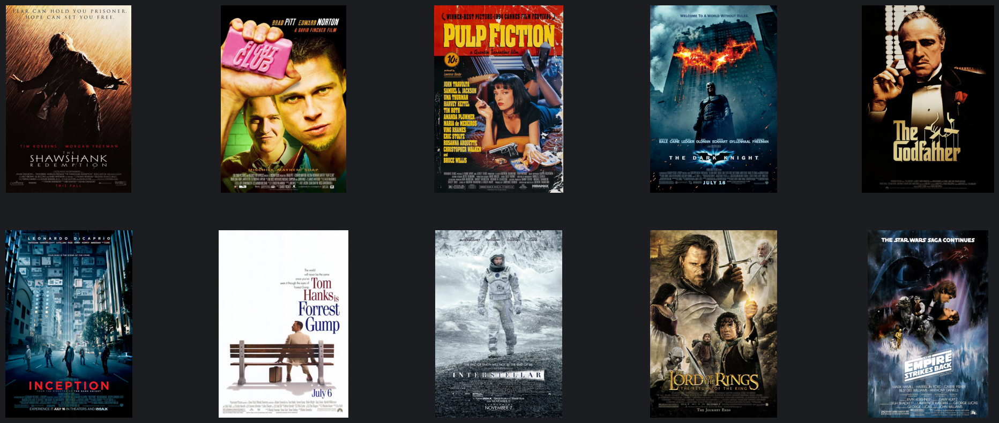

In [27]:
# Getting top-rated movies without specifying a genre or verdict
results = getTopRatedMovies(data)

# Plotting movie covers for the recommended movies
plotMovieCovers(results)

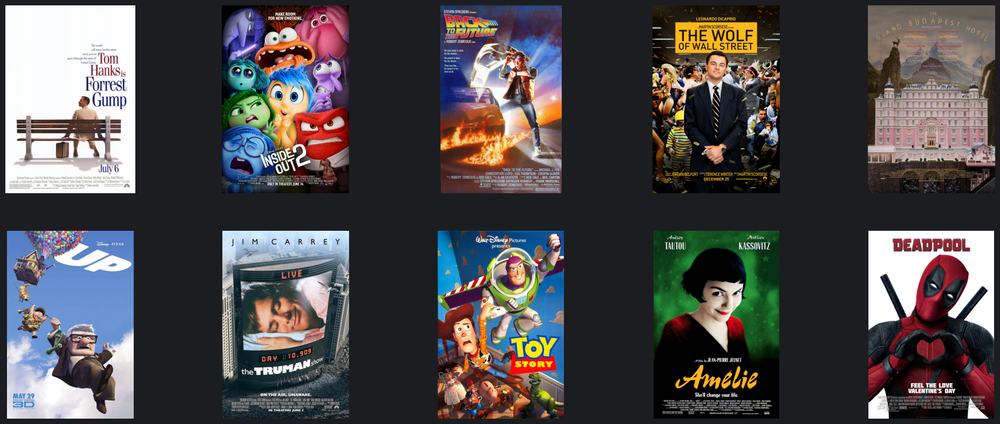

In [28]:
# Getting top-rated movies for a specific genre and verdict (e.g. blockbuster comedy movies)
results = getTopRatedMovies(data, genre = 'Comedy', verdict = 'Blockbuster')

# Plotting movie covers for the recommended movies
plotMovieCovers(results)

Congratulations ! We've successfully implemented our first recommender system using demographic filtering. This basic approach provides a general list of recommended movies (by genre and verdict) to all users, without considering individual preferences or tastes. While it serves as a good starting point, demographic filtering has limitations in personalization and may not accurately reflect the interests of each user.

## Content-Based Filtering

In this section, we'll explore content-based filtering, a recommendation technique that utilizes the content of the movies (such as overview, cast, crew, keywords, etc.) to find similarities between movies.

We'll create a reverse mapping of movie titles to dataframe indices. This reverse mapping provides a mechanism to identify the index of a movie in our metadata dataframe based on its title. By establishing this mapping, we can efficiently retrieve information about specific movies and access their corresponding dataframe indices for further analysis.

In [29]:
# Creating a pandas Series to map movie titles to dataframe indices
indices = pd.Series(data.index, index = data['original_title'])
indices.head()

original_title
Avatar                                      0
Pirates of the Caribbean: At World's End    1
Spectre                                     2
The Dark Knight Rises                       3
John Carter                                 4
dtype: int64

### Plot Description-Based Recommender

In this section, we'll develop a plot description-based recommender system. This approach involves computing pairwise similarity scores for all movies based on their plot descriptions and using these scores to recommend movies with similar plots to users.

By analyzing the textual descriptions of movie plots, we can quantify the similarity between movies and identify those with comparable storylines or themes. This enables us to recommend movies that are likely to appeal to users based on their preferences for certain plot elements or narrative structures.

In [30]:
# Displaying the first few entries of the 'overview' column
data['overview'].head()

0    22nd centuri , parapleg marin dispatch moon pa...
1    captain barbossa , long believ dead , come bac...
2    cryptic messag bond ’ past send trail uncov si...
3    follow death district attorney harvey dent , b...
4    john carter war-weari , former militari captai...
Name: overview, dtype: object

In text processing, it's crucial to convert the word vector of each overview into a suitable format for analysis. Here, we'll compute [Term Frequency-Inverse Document Frequency (TF-IDF)](https://en.wikipedia.org/wiki/Tf–idf) vectors for each movie overview.

**Term Frequency (TF)** represents the relative frequency of a word in a document and is calculated as the ratio of the term instances to the total instances in the document. On the other hand, **Inverse Document Frequency (IDF)** measures the relative count of documents containing the term and is given as the logarithm of the ratio of the total number of documents to the number of documents containing the term. The product of TF and IDF yields the overall importance of each word to the documents in which they appear.

By employing TF-IDF vectorization, we aim to reduce the significance of words that occur frequently in plot overviews while enhancing the importance of rare words that might be more meaningful for distinguishing between movies.

Thankfully, scikit-learn provides a convenient built-in `TfidfVectorizer()` class that simplifies the process of generating the TF-IDF matrix with just a few lines of code.

In [31]:
# Initializing the TF-IDF vectorizer and excluding stop words
tfidf = TfidfVectorizer(stop_words = 'english')

# Fitting and transforming the movie overview data to generate the matrix
tfidfMatrix = tfidf.fit_transform(data['overview'])

# Displaying the shape of the matrix
tfidfMatrix.shape

(4757, 15274)

We observe that over 15,000 unique words were used to describe the 4757 movies in our dataset. This indicates the breadth and diversity of vocabulary present in our movie overviews.

There are various similarity scores available, such as the [Euclidean distance](https://en.wikipedia.org/wiki/Euclidean_distance), [Pearson correlation coefficient](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient), and [cosine similarity](https://en.wikipedia.org/wiki/Cosine_similarity) scores. While each score has its own merits, **cosine similarity** is particularly well-suited for text-based data like ours. It is independent of magnitude and is relatively easy and fast to calculate.

But what exactly is cosine similarity ?

Cosine similarity is a metric used to measure how similar two items are based on their word frequency vectors. It calculates the cosine of the angle between two vectors projected in a multi-dimensional space. The resulting score ranges from -1 to 1, where :

* 1 indicates that the vectors are perfectly similar
* 0 indicates no similarity
* -1 indicates that the vectors are perfectly dissimilar

Mathematically, it is defined as :

<center><img src = 'https://memgraph.com/images/blog/cosine-similarity-python-scikit-learn/cosine-similarity-formula-equivalent.png'></center>

Since we have used the TF-IDF vectorizer, calculating the dot product will directly give us the cosine similarity score. Therefore, we will use scikit-learn's `linear_kernel()` instead of `cosine_similarity()` since it is faster and more efficient for large datasets.

In [32]:
# Computing cosine similarity matrix
cosineSim = linear_kernel(tfidfMatrix, tfidfMatrix)

To suggest movie recommendations based on a given title, we'll follow these steps :

1. ***Retrieve Index*** : Get the index of the movie in the dataset based on its title.

2. ***Calculate Similarity Scores*** : Obtain the list of cosine similarity scores between the selected movie and all other movies in the dataset. Convert this list into a collection of tuples, where each tuple contains the index of a movie and its corresponding similarity score.

3. ***Sort Scores*** : Sort the list of tuples based on the similarity scores in descending order. This ensures that the most similar movies appear first in the list.

4. ***Select Top Recommendations*** : Extract the top elements from the sorted list, excluding the first element (which corresponds to the selected movie itself).

5. ***Display Movie Covers*** : Show the movie covers of the recommended movies.

In [33]:
# Function to get movie recommendations using cosine similarity matrix
def getRecommendations(title, cosineSim, num = 10):
    # Getting the index of the input movie title
    movieIndex = indices[title]
    
    # Getting the similarity scores of the input movie with all other movies
    simScores = list(enumerate(cosineSim[movieIndex]))
    
    # Sorting the similarity scores in descending order
    simScores = sorted(simScores, reverse = True, key = lambda x : x[1])
    
    # Excluding the first element (self) and selecting the top 'num' similar movies
    simScores = simScores[1:num + 1]
    
    # Extracting the indices of the top recommended movies
    movieIndices = [x[0] for x in simScores]
    
    # Returning the recommended movies
    return data.iloc[movieIndices]

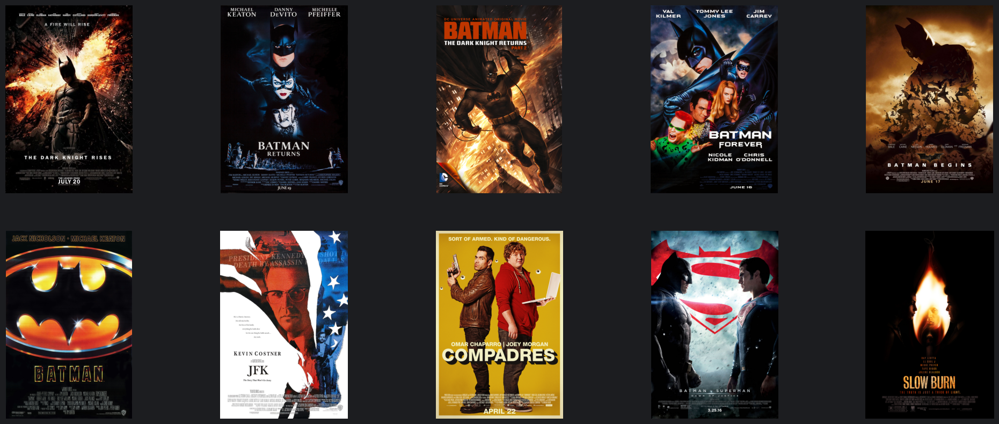

In [35]:
# Generating recommendations for the movie 'The Dark Knight'
results = getRecommendations('The Dark Knight', cosineSim)['original_title']

# Plotting movie covers for the recommended movies
plotMovieCovers(results)

Our plot-based recommender performs admirably when recommending movies from well-known franchises like **The Dark Knight**. However, it falls short in considering vital aspects such as directorial style and genre preferences, which play a crucial role in determining one's enjoyment of a film.

For instance, consider a viewer who is a fan of **Christopher Nolan**'s gritty and realistic approach to filmmaking, evident in *The Dark Knight*. While our system might accurately suggest other Batman movies due to their similar plot elements, it may overlook the viewer's preference for Nolan's directorial style. As a result, the recommendations might include campier Batman films (like **Batman Forever**) that diverge significantly from Nolan's signature style, potentially leading to disappointment for the viewer.

### Metadata-Based Recommender

In this section, we delve into a content-based filtering approach focusing on movie credits, genres, and keywords. Leveraging richer metadata, including the **top three actors**, **director**, **genres**, **keywords**, and **production companies**, we aim to enhance the quality of our recommendations.

By incorporating a diverse range of metadata, our recommender system gains deeper insights into the characteristics and attributes of each movie. This enables more nuanced and personalized recommendations, catering to the diverse preferences of users.

In [36]:
# Displaying the first few rows of the dataframe with selected features
data[['original_title', 'cast', 'director', 'keywords', 'genres', 'production_companies']].head()

,original_title,cast,director,keywords,genres,production_companies
0,Avatar,"[samworthington, zoesaldana, sigourneyweaver]",jamescameron,"[cultureclash, future, spacewar]","[action, adventure, fantasy]","[ingeniousfilmpartners, twentiethcenturyfoxfil..."
1,Pirates of the Caribbean: At World's End,"[johnnydepp, orlandobloom, keiraknightley]",goreverbinski,"[ocean, drugabuse, exoticisland]","[adventure, fantasy, action]","[waltdisneypictures, jerrybruckheimerfilms, se..."
2,Spectre,"[danielcraig, christophwaltz, léaseydoux]",sammendes,"[spy, basedonnovel, secretagent]","[action, adventure, crime]","[columbiapictures, danjaq, b24]"
3,The Dark Knight Rises,"[christianbale, michaelcaine, garyoldman]",christophernolan,"[dccomics, crimefighter, terrorist]","[action, crime, drama]","[legendarypictures, warnerbros., dcentertainment]"
4,John Carter,"[taylorkitsch, lynncollins, samanthamorton]",andrewstanton,"[basedonnovel, mars, medallion]","[action, adventure, sciencefiction]",[waltdisneypictures]


In [37]:
# Function to create metadata soup
def createSoup(row):
    # Joining cast list into a single string
    cast = ' '.join(row['cast'])
    
    # Joining keywords list into a single string and stemming them
    keywords = ' '.join(row['keywords'])
    keywords = stemText(keywords)
    
    # Joining genres list into a single string
    genres = ' '.join(row['genres'])
    
    # Joining production companies list into a single string
    prodCompanies = ' '.join(row['production_companies'])
    
    # Combining all elements into a single soup string (while giving emphasis to the director)
    return f"{cast} {row['director']} {row['director']} {row['director']} {keywords} {genres} {prodCompanies}"

In [38]:
# Applying 'createSoup()' function to each row in the dataframe to create a 'soup' column
data['soup'] = data.apply(createSoup, axis = 1)

# Displaying the 'soup' column for the first few rows
data['soup'].head()

0    samworthington zoesaldana sigourneyweaver jame...
1    johnnydepp orlandobloom keiraknightley gorever...
2    danielcraig christophwaltz léaseydoux sammende...
3    christianbale michaelcaine garyoldman christop...
4    taylorkitsch lynncollins samanthamorton andrew...
Name: soup, dtype: object

In this step, we utilize the `CountVectorizer()` to convert our textual data into numerical vectors. Unlike TF-IDF, which considers the frequency of words relative to their occurrence across all documents, the `CountVectorizer()` simply counts the occurrences of words in each document.

By using the `CountVectorizer()`, we ensure that the presence of actors, directors, genres, keywords, and production companies is appropriately weighted in our recommendation system. This approach allows us to capture the importance of these features without down-weighting them based on their frequency in the dataset.

In [39]:
# Creating a CountVectorizer() object with stop words removed
count = CountVectorizer(stop_words = 'english')

# Fitting and transforming the 'soup' column using CountVectorizer() to create a matrix
countMatrix = count.fit_transform(data['soup'])

# Displaying the shape of the matrix
countMatrix.shape

(4757, 14878)

The resulting shape of the count matrix (4757 movies by 14875 unique features) indicates that we have successfully transformed our textual metadata into a numerical format suitable for analysis and recommendation. Each row represents a movie, while each column represents a unique feature extracted from the metadata.

In this step, we compute the cosine similarity matrix using the count matrix generated from the metadata. Unlike the plot-based recommender, where we used the `linear_kernel()` function due to its speed and efficiency with TF-IDF matrices, this time we directly employ the `cosine_similarity()` function.

The reason for this choice is that the count matrix represents the frequency of occurrence of features in each movie's metadata. Therefore, using `cosine_similarity()` directly on this matrix allows us to compute the similarity between movies based on the presence and frequency of shared features. This approach provides a straightforward and intuitive measure of similarity between movies, making `cosine_similarity()` a suitable choice.

In [40]:
# Computing cosine similarity matrix using the count matrix
cosineSim2 = cosine_similarity(countMatrix, countMatrix)

We'll utilize the `getRecommendations()` function we developed earlier. With the updated cosine similarity scores, we anticipate receiving different (and hopefully improved) results. Let's revisit *The Dark Knight* and explore the recommendations it generates this time.

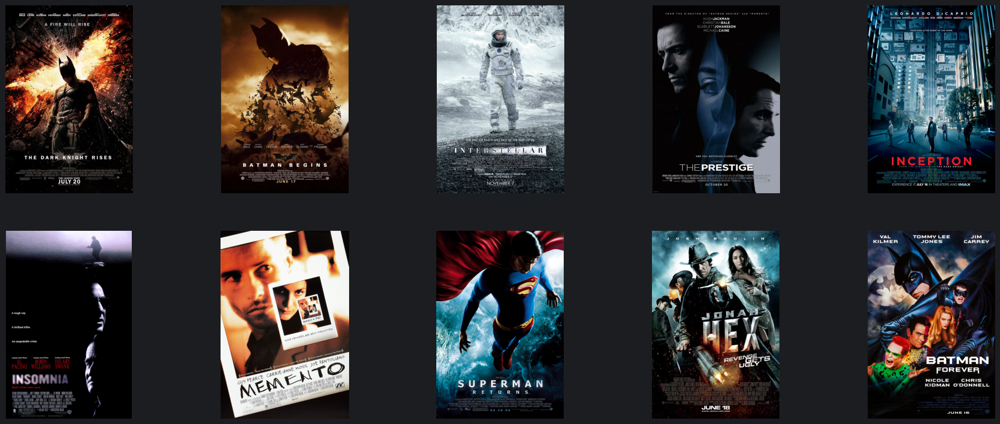

In [41]:
# Generating recommendations for the movie 'The Dark Knight' using the second cosine similarity matrix
results = getRecommendations('The Dark Knight', cosineSim2)['original_title']

# Plotting movie covers of the recommended movies
plotMovieCovers(results)

The latest results are quite satisfying. The recommendations appear to have identified several Christopher Nolan movies, likely due to the emphasis on the director as a key feature. Among the top recommendations, many stand out as movies worth exploring.

There's ample room for experimentation with this engine. We can adjust the weights assigned to different features such as directors, actors, and genres. Other potential enhancements include limiting the number of keywords used in the analysis, weighting genres based on their frequency, and filtering movies by language. These adjustments can fine-tune the recommendations to better suit individual preferences and viewing habits.

## Filtering Recommendations by Popularity and Ratings

Our recommendation system may overlook the importance of movie ratings and popularity, leading to the inclusion of movies like **Batman Forever**, which, despite thematic similarities to **The Dark Knight**, fails to meet quality standards.

To improve our recommendations, we'll implement a system to filter out poorly rated or unpopular movies. This way, we can focus on suggesting movies that not only share similar themes but also have good critical acclaim and audience appeal.

Here's what we'll do :

1. ***Selecting Top Movies*** : Using the `getRecommendations()` function, we'll pick the top 25 movies based on similarity scores (using `cosineSim2` in particular).

2. ***Determining Popularity Threshold*** : We'll find the vote count of the 60th percentile movie in this selection. This threshold, called *m*, will help us gauge a movie's popularity.

3. ***Calculating Weighted Ratings*** : We'll calculate a weighted rating for each movie using IMDB's formula. This method ensures we consider both the average rating and the number of votes a movie has received.

By introducing the `getImprovedRecommendations()` function, we aim to enhance our recommendation system.

In [42]:
# Function to get improved recommendations based on similarity scores and ratings
def getImprovedRecommendations(title):
    # Getting recommendations based on cosine similarity scores
    results = getRecommendations(title, cosineSim2, num = 25)
    
    # Filtering top recommendations by ratings and popularity
    return getTopRatedMovies(results, percentile = 0.60)

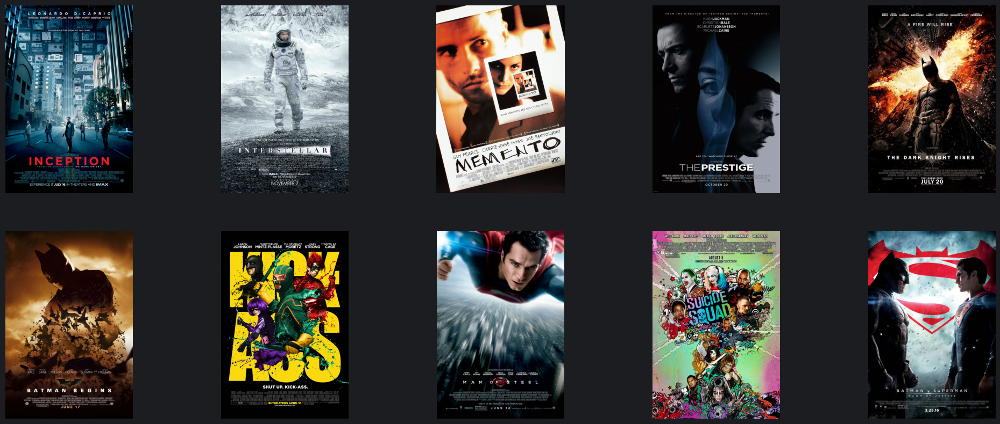

In [43]:
# Generating improved recommendations for the movie 'The Dark Knight'
results = getImprovedRecommendations('The Dark Knight')

# Plotting movie covers of the recommended movies
plotMovieCovers(results)

After analyzing the improved recommendations generated for *The Dark Knight*, it's evident that the selection comprises a diverse array of high-quality movies. From captivating thrillers to thought-provoking dramas, each recommendation offers a unique cinematic experience. This underscores the effectiveness of our enhanced recommendation system, which adeptly identifies movies aligned with user preferences while ensuring a robust standard of quality. As a result, users can explore a curated list of engaging films that promise to captivate and entertain.

# Conclusion

Throughout this notebook, we embarked on a journey into the realm of movie recommendation systems, exploring techniques to provide personalized movie suggestions to users. Starting with *Demographic Filtering*, we developed algorithms to recommend movies based on user characteristics such as genre preferences.

We delved deeper into *Content-Based Filtering*, leveraging movie metadata and plot descriptions to identify similarities and make recommendations. Utilizing cosine similarity and other metrics, we crafted systems that suggested movies based on thematic and content-related connections.

Our exploration showcased the versatility of recommendation systems in delivering tailored movie suggestions to users, enhancing their viewing experience and engagement. Moving forward, further research and experimentation in alternative recommendation approaches could complement existing techniques, enriching our understanding and capabilities in the field of movie recommendation.

## Acknowledgments

I would like to express my gratitude to the authors of the following Kaggle notebooks, whose insights and code implementations greatly aided in the development of this project :

* [Getting Started with a Movie Recommendation System](https://www.kaggle.com/code/ibtesama/getting-started-with-a-movie-recommendation-system) by Ibtesam Ahmed

* [Movie Recommender Systems](https://www.kaggle.com/code/rounakbanik/movie-recommender-systems) by Rounak Banik